<a href="https://colab.research.google.com/github/tmtsmrsl/TrendingYoutubeVideos/blob/main/Trending_Youtube_Videos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis on the Trending YouTube Videos in Indonesia (2022)

An analysis about trending youtube videos in Indonesia since the start of 2022 up to 13 Sep 2022. Around 200 trending videos were updated on each day.

## Import Necessary Libraries and Set Some Configurations





In [ ]:
! pip install isodate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 439 kB/s 


In [ ]:
import googleapiclient.discovery
from google.cloud import bigquery
from getpass import getpass
import isodate
import json
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
import plotly.io as pio

# Create a custom theme and set it as default
pio.templates["custom"] = pio.templates["plotly_white"]
pio.templates["custom"].layout.margin = {'b': 25, 'l': 25, 'r': 25, 't': 50}
pio.templates["custom"].layout.width = 600
pio.templates["custom"].layout.height = 450
pio.templates["custom"].layout.autosize = False
pio.templates["custom"].layout.font.family="Arial"
pio.templates["custom"].layout.title.update({"x":0.5, "xref":"paper", "font_family":"Arial Black"})
pio.templates["custom"].layout.xaxis.update({"showline":True, "linecolor":"darkgray"})
pio.templates["custom"].layout.yaxis.update({"showline":True, "linecolor":"darkgray"})
pio.templates["custom"].layout.colorway = ['#1F77B4', '#FF7F0E', '#54A24B', '#D62728', '#C355FA',
                                           '#8C564B', '#E377C2', '#7F7F7F',"#FFE323", '#17BECF']
pio.templates.default = "custom"

## Request Data From YouTube Data API

Make a function to request the current trending videos data from YouTube Data API and store the important results into a dataframe.

In [ ]:
def fetch_trending_vid(regionCode, number_of_results):
    # Enter the informations needed to create an API client
    api_service_name = "youtube"
    api_version = "v3"
    api_key = getpass('Enter the API key: ')
    youtube = googleapiclient.discovery.build(api_service_name, api_version, developerKey=api_key)

    # Make a dataframe to store the results
    trending_vid = pd.DataFrame(columns=['videoId', 'publishedAt', 'channelId', 'title', 
                    'description', 'thumbnails', 'channelTitle', 'tags', 
                    'categoryId','duration', 'dimension', 'definition', 'caption',
                    'licensedContent', 'viewCount', 'likeCount', 'commentCount',
                    'trendingAt'])
    
    # Keep making requests until nextPageToken is equal to None (no more result
    # to fetch) or the appropriate number of results have been fetched.
    np_token = "placeholder"
    while (np_token is not None) and (trending_vid.shape[0] < number_of_results):
        # Make a request for the first iteration (without pageToken)
        if np_token == "placeholder":
            request = youtube.videos().list(
                part="snippet,contentDetails,statistics",
                chart="mostPopular",
                maxResults=50,
                regionCode="ID"
                )
        # Make a request for the subsequent iteration (with pageToken)
        else:
            request = youtube.videos().list(
                part="snippet,contentDetails,statistics",
                chart="mostPopular",
                maxResults=50,
                regionCode="ID",
                pageToken=np_token
                )
            
        response = request.execute()

        # Loop through each video item and store the relevant results into a temporary dataframe
        temp_df = pd.DataFrame(columns=['videoId', 'publishedAt', 'channelId', 'title', 
                                'description', 'thumbnails', 'channelTitle', 'tags', 
                                'categoryId','duration', 'dimension', 'definition', 'caption',
                                'licensedContent', 'viewCount', 'likeCount', 'commentCount',
                                'trendingAt'])
        time_now = pd.Timestamp.now(tz='UTC')
        for n in range(len(response['items'])):
            item_n = response['items'][n]
            infos = {'snippet':['publishedAt', 'channelId', 'title', 
                                'description', 'thumbnails', 'channelTitle', 'tags', 
                                'categoryId'],
                     'contentDetails':['duration', 'dimension', 'definition', 'caption',
                                'licensedContent'],
                     'statistics':['viewCount', 'likeCount', 'commentCount']}

            temp_df.at[n, 'videoId'] = item_n['id']
            temp_df.at[n, 'trendingAt'] = time_now
            for k in infos.keys():
                for v in infos[k]:
                    # Use try/except to handle non-available data
                    try:
                        temp_df.at[n, v] = item_n[k][v]
                    except:
                        temp_df.at[n, v] = np.nan
            try:
                temp_df.at[n, 'thumbnails'] = temp_df.at[n, 'thumbnails']['high']['url']
            except:
                temp_df.at[n, 'thumbnails'] = np.nan
                    
        # Append the results from temp_df to trending_vid
        trending_vid = pd.concat([trending_vid, temp_df], axis=0, ignore_index=True)
        
        # Get a new nextPageToken for the next iteration
        np_token = response.get('nextPageToken')

    # Convert dtype 
    trending_vid = trending_vid.astype('str')
    trending_vid[['caption', 'licensedContent']] = trending_vid[['caption', 'licensedContent']].astype('bool')
    trending_vid['categoryId'] = trending_vid['categoryId'].astype('int64')
    trending_vid[['viewCount', 'likeCount', 'commentCount']] = trending_vid[['viewCount', 'likeCount', 'commentCount']].astype('float64')
    return trending_vid

The two functions below will be used during data analysis.

In [ ]:
def fetch_channel_info(id_list):
    # Enter the informations needed to create an API client
    api_service_name = "youtube"
    api_version = "v3"
    api_key = getpass('Enter the API key: ')
    youtube = googleapiclient.discovery.build(api_service_name, api_version, developerKey=api_key)

    # Make a dataframe to store the results
    channel_info = pd.DataFrame(columns=['id', 'title','description','publishedAt',
                                         'thumbnails', 'country', 'uploads', 
                                         'viewCount', 'subscriberCount', 'videoCount'])

    # Loop through each id and make a request
    for n in range(len(id_list)):
        id = id_list[n]
        request = youtube.channels().list(
            part="snippet,contentDetails,statistics",
            id=id
        )
        response = request.execute()

        # Store the relevant results into the dataframe
        # Use try/except to handle non-available data
        item = response['items'][0]
        infos = {'snippet':['title', 'description', 'publishedAt', 
                            'thumbnails', 'country'],
                'statistics':['viewCount', 'subscriberCount', 'videoCount']}

        channel_info.at[n, 'id'] = item['id']
        for k in infos.keys():
            for v in infos[k]:
                try:
                    channel_info.at[n, v] = item[k][v]
                except:
                    channel_info.at[n, v] = np.nan
        try:
            channel_info.at[n, 'thumbnails'] = item['snippet']['thumbnails']['high']['url']
        except:
            channel_info.at[n, 'thumbnails'] = np.nan

        try:
            channel_info.at[n, 'uploads'] = item["contentDetails"]["relatedPlaylists"]['uploads']
        except:
            channel_info.at[n, 'uploads'] = np.nan

    return channel_info

In [ ]:
def fetch_video_lang(id_list):
    # Enter the informations needed to create an API client
    api_service_name = "youtube"
    api_version = "v3"
    api_key = getpass('Enter the API key: ')
    youtube = googleapiclient.discovery.build(api_service_name, api_version, developerKey=api_key)

    # Make a dataframe to store the results
    video_lang = pd.DataFrame(columns=['id','defaultLanguage','defaultAudioLanguage'])

    # Loop through each id and make a request
    for n in range(len(id_list)):
        id = id_list[n]
        request = youtube.videos().list(
            part="snippet,contentDetails,statistics",
            id=id
        )
        response = request.execute()

        # Store the relevant results into the dataframe
        # Use try/except to handle non-available data
        try:
            item = response['items'][0]
        except:
            continue
        infos = {'snippet':['defaultLanguage', 'defaultAudioLanguage']}
        video_lang.at[n, 'id'] = item['id']
        for k in infos.keys():
            for v in infos[k]:
                try:
                    video_lang.at[n, v] = item[k][v]
                except:
                    video_lang.at[n, v] = np.nan

    return video_lang

Execute the function to fetch the current 200 trending videos in Indonesia.

In [ ]:
trending_vid = fetch_trending_vid(regionCode='id', number_of_results=200)
trending_vid.head()

,videoId,publishedAt,channelId,title,description,thumbnails,channelTitle,tags,categoryId,duration,dimension,definition,caption,licensedContent,viewCount,likeCount,commentCount,trendingAt
0,x75hb5XtswM,2022-09-12T17:01:36Z,UChaxDyZXnYED7Zb19jOzyEA,Taekwondo Aerobic Memukau Dari N Lions | Quart...,Penampilan N Lions kali ini ditambahkan sediki...,https://i.ytimg.com/vi/x75hb5XtswM/hqdefault.jpg,Indonesia's Got Talent 2022,"['N Lions', 'Quarter Final', 'Indonesia`s Got ...",24,PT15M27S,2d,hd,False,True,583420.0,24901.0,2031.0,2022-09-13 13:10:57.439880+00:00
1,JNAanp1mAEM,2022-09-12T12:00:11Z,UCX8fgYn9Lses2DqBqzhXAsw,Maulana Ardiansyah Ft. Ochi Alvira - Ojo Diban...,Official Music Video From Maulana Ardiansyah F...,https://i.ytimg.com/vi/JNAanp1mAEM/hqdefault.jpg,TA PRO Music & Publishing,"['Abah Lala', 'Album Maulana Ardiansyah', 'Due...",10,PT6M28S,2d,hd,False,True,279808.0,8782.0,1832.0,2022-09-13 13:10:57.439880+00:00
2,xRQYY_YHjXM,2022-09-10T11:51:54Z,UCFuM3BWlLM3YbLjkXBiJ8-A,STREET FOOD PIK WITH JEROME!,Subscribe @Nihongo Mantappu \n\nSocial Media:\...,https://i.ytimg.com/vi/xRQYY_YHjXM/hqdefault.jpg,Jessica Jane,"['JESSICA JANE', 'JESIKA JANE', '24 JAM JESSIC...",24,PT27M25S,2d,hd,False,True,2482453.0,151122.0,4277.0,2022-09-13 13:10:57.439880+00:00
3,tkJ2zAEm9gg,2022-09-12T13:00:29Z,UCzTsWuCdVP_vehWyGwPcS3Q,Salam Olah Raga Dari Kang Murad - PREMAN PENSI...,"Kang Murad menjaga keberadaan Mawar, karna sud...",https://i.ytimg.com/vi/tkJ2zAEm9gg/hqdefault.jpg,RCTI - LAYAR DRAMA INDONESIA,"['Preman Pensiun 6', 'Preman Pensiun', 'Epy Ku...",24,PT10M54S,2d,hd,False,True,933359.0,9332.0,1197.0,2022-09-13 13:10:57.439880+00:00
4,BN9WZqHAUPw,2022-09-10T10:17:38Z,UC1Gmqqs_Myzl2KHIeqfUC9A,SEHARIAN MAIN DI DUFAN BARENG JESSICA JANE!! |...,Konnijiwa! ASLII SERU BANGET SEHARIAN MAIN DI ...,https://i.ytimg.com/vi/BN9WZqHAUPw/hqdefault.jpg,Nihongo Mantappu,"['nihongo mantappu', 'nihongo', 'mantappu', 'm...",22,PT23M5S,2d,hd,False,True,2933518.0,174489.0,8462.0,2022-09-13 13:10:57.439880+00:00


In [ ]:
trending_vid.shape

(200, 18)

We have successfully retrieved 200 trending videos in Indonesia for the current time (2022-09-13 13:10:57 UTC). Unfortunately we cannot retrieve the trending youtube videos in the past.

## Download Indonesia's Trending YouTube Videos Dataset

Since we don't have time machine, we will use the [dataset](https://www.kaggle.com/datasets/syahrulhamdani/indonesias-trending-youtube-video-statistics) from Kaggle to retrieve the historical data of trending youtube videos. The dataset contains Indonesia's trending youtube videos since 2021 which is updated once per day (~200 videos per update).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
! kaggle datasets download syahrulhamdani/indonesias-trending-youtube-video-statistics

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 77% 49.0M/63.3M [00:01<00:00, 48.7MB/s]
100% 63.3M/63.3M [00:01<00:00, 46.6MB/s]


In [ ]:
!unzip indonesias-trending-youtube-video-statistics

Archive:  indonesias-trending-youtube-video-statistics.zip
  inflating: category.json           
  inflating: trending.csv            


Save both files to Google Drive

In [ ]:
import shutil
colab_links = ["/content/trending.csv", "/content/category.json"]
gdrive_link = "/content/drive/MyDrive/"
for colab_link in colab_links:
    shutil.copy(colab_link, gdrive_link)

In [ ]:
trending_past = pd.read_csv("/content/drive/MyDrive/trending.csv")
trending_past.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (0,5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,video_id,publish_time,channel_id,title,description,thumbnail_url,thumbnail_width,thumbnail_height,channel_name,tags,category_id,live_status,local_title,local_description,duration,dimension,definition,caption,license_status,allowed_region,blocked_region,view,like,dislike,favorite,comment,trending_time
0,NaN,2021-02-05T09:00:34Z,UCEf_Bc-KVd7onSeifS3py9g,aespa 에스파 'Forever (약속)' MV,"aespa's new single ""Forever"" is out!\nListen a...",NaN,NaN,NaN,SMTOWN,NaN,10,none,aespa 에스파 'Forever (약속)' MV,"aespa's new single ""Forever"" is out!\nListen a...",PT5M7S,2d,hd,True,True,NaN,NaN,7806846.0,857902.0,24078.0,0,94961.0,2021-02-07 05:46:51.832614+00:00
1,NaN,2021-02-04T15:54:08Z,UCYEa4_MC7OFjcWrO6SO-u8g,[FULL] Siapa di Balik Kudeta AHY? | Dua Sisi t...,"Jakarta, https://www.tvonenews.com - Ketua umu...",NaN,NaN,NaN,Indonesia Lawyers Club,"['tvone', 'tv one', 'tvonenews', 'indonesia la...",25,none,[FULL] Siapa di Balik Kudeta AHY? | Dua Sisi t...,"Jakarta, https://www.tvonenews.com - Ketua umu...",PT42M30S,2d,hd,False,True,NaN,NaN,885038.0,6765.0,1263.0,0,6365.0,2021-02-07 05:46:51.832649+00:00
2,NaN,2021-02-06T03:00:22Z,UCu12RxQjRQyh79YBYvEDkOg,CABRIOLET CHALLENGE: TANTANGAN MENGGODA (7/12),Road Party Season 2: Cabriolet Challenge\n\nEp...,NaN,NaN,NaN,Motomobi,"['MotoMobi', 'Mobil', 'motor', 'review', 'indo...",2,none,CABRIOLET CHALLENGE: TANTANGAN MENGGODA (7/12),Road Party Season 2: Cabriolet Challenge\n\nEp...,PT46M43S,2d,hd,False,True,NaN,NaN,889708.0,47895.0,532.0,0,8785.0,2021-02-07 05:46:51.832664+00:00
3,NaN,2021-02-05T20:26:08Z,UCCuzDCoI3EUOo_nhCj4noSw,With Windah Basudara & Hans,Join this channel to get access to perks:\nhtt...,NaN,NaN,NaN,yb,NaN,20,none,With Windah Basudara & Hans,Join this channel to get access to perks:\nhtt...,PT45M59S,2d,hd,False,True,NaN,NaN,1006854.0,91973.0,3967.0,0,12957.0,2021-02-07 05:46:51.832678+00:00
4,NaN,2021-02-03T23:14:54Z,UC14UlmYlSNiQCBe9Eookf_A,🤯 LATE COMEBACK DRAMA! | HIGHLIGHTS | Granada ...,"With just two minutes to play, Barça looked to...",NaN,NaN,NaN,FC Barcelona,"['FC Barcelona', 'برشلونة،', 'Fútbol', 'FUTBOL...",17,none,🤯 LATE COMEBACK DRAMA! | HIGHLIGHTS | Granada ...,"With just two minutes to play, Barça looked to...",PT5M12S,2d,hd,False,True,NaN,NaN,6275035.0,218131.0,4289.0,0,12799.0,2021-02-07 05:46:51.832730+00:00


In [ ]:
trending_past.tail()

,video_id,publish_time,channel_id,title,description,thumbnail_url,thumbnail_width,thumbnail_height,channel_name,tags,category_id,live_status,local_title,local_description,duration,dimension,definition,caption,license_status,allowed_region,blocked_region,view,like,dislike,favorite,comment,trending_time
105146,E9kFEjArR0c,2022-08-22T23:01:52Z,UC6yW44UGJJBvYTlfC7CRg2Q,WHAT A WIN! ❤️‍🔥 | Man Utd 2-1 Liverpool | Hig...,Relive our 2-1 victory over rivals Liverpool a...,https://i.ytimg.com/vi/E9kFEjArR0c/hqdefault.jpg,480.0,360.0,Manchester United,"['manchester united', 'mufc', 'man utd', 'manu...",17,none,WHAT A WIN! ❤️‍🔥 | Man Utd 2-1 Liverpool | Hig...,Relive our 2-1 victory over rivals Liverpool a...,PT2M28S,2d,hd,False,True,NaN,NaN,8745242.0,194258.0,NaN,0,6610.0,2022-09-12 06:04:41.900862+00:00
105147,zPOa8KPsSPg,2022-08-24T09:00:37Z,UCqq-ovGE01ErlXakPihhKDA,IVE _ After LIKE | 아이브 | 스페셜클립 | 퍼포먼스 | Specia...,IVE _ After LIKE | 아이브 | 스페셜클립 | 퍼포먼스 | Specia...,https://i.ytimg.com/vi/zPOa8KPsSPg/hqdefault.jpg,480.0,360.0,1theK Originals - 원더케이 오리지널,"['아이브', 'IVE', 'After LIKE', '애프터라이크', '아이브 Af...",24,none,IVE _ After LIKE | 아이브 | 스페셜클립 | 퍼포먼스 | Specia...,IVE _ After LIKE | 아이브 | 스페셜클립 | 퍼포먼스 | Specia...,PT3M6S,2d,hd,True,True,NaN,NaN,3637119.0,127486.0,NaN,0,4076.0,2022-09-12 06:04:41.900870+00:00
105148,zR_UY_GZErk,2022-08-25T13:23:55Z,UC5xAPCVizxOfnMECMXkal2Q,TERNYATA BEGINI PERASAAN KIANO ..,=================================\r\n\r\nSocia...,https://i.ytimg.com/vi/zR_UY_GZErk/hqdefault.jpg,480.0,360.0,Baim Paula,"['bapau', 'baim paula', 'baim wong', 'paula ve...",24,none,TERNYATA BEGINI PERASAAN KIANO ..,=================================\r\n\r\nSocia...,PT21M18S,2d,hd,False,True,NaN,NaN,533982.0,27809.0,NaN,0,1793.0,2022-09-12 06:04:41.900878+00:00
105149,sZZyQ7RgiEs,2022-08-26T10:04:49Z,UC5BMQOsAB8hKUyHu9KI6yig,After LIKE - IVE アイヴ [Music Bank] | KBS WORLD...,#AfterLIKE #IVE\n\nAfterLIKE - IVE(아이브 アイヴ)\n💚...,https://i.ytimg.com/vi/sZZyQ7RgiEs/hqdefault.jpg,480.0,360.0,KBS WORLD TV,"['kbs', 'kbsworld', 'kbs world', 'yt:cc=on', '...",10,none,After LIKE - IVE アイヴ [Music Bank] | KBS WORLD...,#AfterLIKE #IVE\n\nAfterLIKE - IVE(아이브 アイヴ)\n💚...,PT4M12S,2d,hd,False,True,NaN,NaN,1741953.0,84331.0,NaN,0,1504.0,2022-09-12 06:04:41.900886+00:00
105150,eN32Qm-BgIA,2022-08-25T09:00:18Z,UCkdFTsMOvJkUe41dCNvWhIg,KITA LAWAN MUTANT WARDEN DAN 10 MUTANT OP DI M...,Stresmen MOD SHOWCASE\n- Subscribe guys\n- Jan...,https://i.ytimg.com/vi/eN32Qm-BgIA/hqdefault.jpg,480.0,360.0,Stresmen,"['Stresmen', 'stresmen minecraft', 'stresmen r...",20,none,KITA LAWAN MUTANT WARDEN DAN 10 MUTANT OP DI M...,Stresmen MOD SHOWCASE\n- Subscribe guys\n- Jan...,PT20M19S,2d,hd,False,True,NaN,NaN,503482.0,23351.0,NaN,0,545.0,2022-09-12 06:04:41.900894+00:00


The dataset (trending_past) contains trending Youtube videos from 2021-02-07 to 2022-09-12. Let's modify the columns and merge the dataset with the data that we retrieve earlier (trending_vid).

In [ ]:
trending_past = trending_past.drop(columns=['thumbnail_width', 'thumbnail_height', 
                                'live_status', 'local_title', 'local_description', 
                                'allowed_region', 'blocked_region', 'dislike',
                                'favorite'])
trending_past.columns = trending_vid.columns
trending_df = pd.concat([trending_past, trending_vid], ignore_index=True)

## Load the Dataframe into BigQuery

In [ ]:
# save dataframe as CSV file in Gdrive
trending_df.to_csv("/content/drive/MyDrive/trending_df.csv")

Provide our credentials to the runtime.

In [ ]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


Indicate the data type for columns with object dtypes.

In [ ]:
schema = []
obj_cols = trending_df.select_dtypes("object").columns
for col in obj_cols:
    schema.append(bigquery.SchemaField("{}".format(col), bigquery.enums.SqlTypeNames.STRING))

Load the data from trending_df dataframe

In [ ]:
client = bigquery.Client(project="youtube-analysis-362305")
table_id = "youtube-analysis-362305.youtube_id.trending"
job_config = bigquery.LoadJobConfig(schema=schema)

# Make an API request.
job = client.load_table_from_dataframe(trending_df, table_id, 
                                       job_config=job_config)  

# Wait for the job to complete.
job.result()  

# Verify the loading process
table = client.get_table(table_id)  
print(
    "Loaded {} rows and {} columns to {}".format(
        job.output_rows, len(table.schema), table_id
    )
)

Loaded 105351 rows and 18 columns to youtube-analysis-362305.youtube_id.trending


Check the loaded data.

In [ ]:
%%bigquery --project youtube-analysis-362305
SELECT * 
FROM `youtube-analysis-362305.youtube_id.trending`
ORDER BY trendingAt
LIMIT 5

,videoId,publishedAt,channelId,title,description,thumbnails,channelTitle,tags,categoryId,duration,dimension,definition,caption,licensedContent,viewCount,likeCount,commentCount,trendingAt
0,None,2021-02-05T09:00:34Z,UCEf_Bc-KVd7onSeifS3py9g,aespa 에스파 'Forever (약속)' MV,"aespa's new single ""Forever"" is out!\nListen a...",None,SMTOWN,None,10,PT5M7S,2d,hd,True,True,7806846.0,857902.0,94961.0,2021-02-07 05:46:51.832614+00:00
1,None,2021-02-04T15:54:08Z,UCYEa4_MC7OFjcWrO6SO-u8g,[FULL] Siapa di Balik Kudeta AHY? | Dua Sisi t...,"Jakarta, https://www.tvonenews.com - Ketua umu...",None,Indonesia Lawyers Club,"['tvone', 'tv one', 'tvonenews', 'indonesia la...",25,PT42M30S,2d,hd,False,True,885038.0,6765.0,6365.0,2021-02-07 05:46:51.832649+00:00
2,None,2021-02-06T03:00:22Z,UCu12RxQjRQyh79YBYvEDkOg,CABRIOLET CHALLENGE: TANTANGAN MENGGODA (7/12),Road Party Season 2: Cabriolet Challenge\n\nEp...,None,Motomobi,"['MotoMobi', 'Mobil', 'motor', 'review', 'indo...",2,PT46M43S,2d,hd,False,True,889708.0,47895.0,8785.0,2021-02-07 05:46:51.832664+00:00
3,None,2021-02-05T20:26:08Z,UCCuzDCoI3EUOo_nhCj4noSw,With Windah Basudara & Hans,Join this channel to get access to perks:\nhtt...,None,yb,None,20,PT45M59S,2d,hd,False,True,1006854.0,91973.0,12957.0,2021-02-07 05:46:51.832678+00:00
4,None,2021-02-03T23:14:54Z,UC14UlmYlSNiQCBe9Eookf_A,🤯 LATE COMEBACK DRAMA! | HIGHLIGHTS | Granada ...,"With just two minutes to play, Barça looked to...",None,FC Barcelona,"['FC Barcelona', 'برشلونة،', 'Fútbol', 'FUTBOL...",17,PT5M12S,2d,hd,False,True,6275035.0,218131.0,12799.0,2021-02-07 05:46:51.832730+00:00


Make a function for the loading process.

In [ ]:
def load_df(df, project_id, table_id):
    # Provide credentials to the runtime.
    auth.authenticate_user()
    print('Authenticated')

    # Indicate the data type for columns with object dtypes.
    schema = []
    obj_cols = df.select_dtypes("object").columns
    for col in obj_cols:
        schema.append(bigquery.SchemaField("{}".format(col), bigquery.enums.SqlTypeNames.STRING))

    # Setup the client and job configuration
    client = bigquery.Client(project=project_id)
    job_config = bigquery.LoadJobConfig(schema=schema)
    job_config.write_disposition = bigquery.WriteDisposition.WRITE_APPEND

    # Make an API request to load the data into BigQuery table.
    job = client.load_table_from_dataframe(df, table_id, job_config=job_config)  

    # Wait for the job to complete.
    job.result()  

    # Verify the loading process
    table = client.get_table(table_id)  
    print(
        "Loaded {} rows and {} columns to {}".format(
            job.output_rows, len(table.schema), table_id
        )
    )

Run the following code daily to retrieve and load the trending videos data for each day.

In [ ]:
import googleapiclient.discovery
from getpass import getpass
import pandas as pd
from google.cloud import bigquery
from google.colab import auth

# You could change the api_key inside fetch_trending_vid function if you don't want to enter your api_key repeatedly
trending_today = fetch_trending_vid(regionCode='id', number_of_results=200)
load_df(df=trending_today, project_id="youtube-analysis-362305", table_id="youtube-analysis-362305.youtube_id.trending")

## Data Wrangling

Load all the data from BigQuery, then save it as a dataframe.

In [ ]:
%%bigquery --project youtube-analysis-362305
SELECT * 
FROM `youtube-analysis-362305.youtube_id.trending`
ORDER BY trendingAt

,videoId,publishedAt,channelId,title,description,thumbnails,channelTitle,tags,categoryId,duration,dimension,definition,caption,licensedContent,viewCount,likeCount,commentCount,trendingAt
0,None,2021-02-05T09:00:34Z,UCEf_Bc-KVd7onSeifS3py9g,aespa 에스파 'Forever (약속)' MV,"aespa's new single ""Forever"" is out!\nListen a...",None,SMTOWN,None,10,PT5M7S,2d,hd,True,True,7806846.0,857902.0,94961.0,2021-02-07 05:46:51.832614+00:00
1,None,2021-02-04T15:54:08Z,UCYEa4_MC7OFjcWrO6SO-u8g,[FULL] Siapa di Balik Kudeta AHY? | Dua Sisi t...,"Jakarta, https://www.tvonenews.com - Ketua umu...",None,Indonesia Lawyers Club,"['tvone', 'tv one', 'tvonenews', 'indonesia la...",25,PT42M30S,2d,hd,False,True,885038.0,6765.0,6365.0,2021-02-07 05:46:51.832649+00:00
2,None,2021-02-06T03:00:22Z,UCu12RxQjRQyh79YBYvEDkOg,CABRIOLET CHALLENGE: TANTANGAN MENGGODA (7/12),Road Party Season 2: Cabriolet Challenge\n\nEp...,None,Motomobi,"['MotoMobi', 'Mobil', 'motor', 'review', 'indo...",2,PT46M43S,2d,hd,False,True,889708.0,47895.0,8785.0,2021-02-07 05:46:51.832664+00:00
3,None,2021-02-05T20:26:08Z,UCCuzDCoI3EUOo_nhCj4noSw,With Windah Basudara & Hans,Join this channel to get access to perks:\nhtt...,None,yb,None,20,PT45M59S,2d,hd,False,True,1006854.0,91973.0,12957.0,2021-02-07 05:46:51.832678+00:00
4,None,2021-02-03T23:14:54Z,UC14UlmYlSNiQCBe9Eookf_A,🤯 LATE COMEBACK DRAMA! | HIGHLIGHTS | Granada ...,"With just two minutes to play, Barça looked to...",None,FC Barcelona,"['FC Barcelona', 'برشلونة،', 'Fútbol', 'FUTBOL...",17,PT5M12S,2d,hd,False,True,6275035.0,218131.0,12799.0,2021-02-07 05:46:51.832730+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105346,nOHLZE8oOs8,2022-08-29T06:48:23Z,UCvh1at6xpV1ytYOAzxmqUsA,Pertama Kali Sisca Kohl Makan di Warteg,Pertama Kali@Sisca Kohl Makan di Warteg ingat ...,https://i.ytimg.com/vi/nOHLZE8oOs8/hqdefault.jpg,Jess No Limit,"['jess no limit', 'jes no limit', 'jess', 'jes...",24,PT10M13S,2d,hd,False,True,4316797.0,173406.0,10314.0,2022-09-13 13:10:58.955074+00:00
105347,ej-Wog01wlY,2022-08-28T13:30:08Z,UCxxnxya_32jcKj4yN1_kD7A,Apotek di Dunia Lain - Episode 08 [Takarir Ind...,✅ Subscribe Muse Indonesia: https://www.youtub...,https://i.ytimg.com/vi/ej-Wog01wlY/hqdefault.jpg,Muse Indonesia,"['異世界薬局', 'isekaiyakkyoku', 'Diomedea', 'apote...",1,PT23M40S,2d,hd,False,True,422552.0,14097.0,963.0,2022-09-13 13:10:58.955074+00:00
105348,_hiR58brDz4,2022-08-28T15:00:00Z,UCzgxx_DM2Dcb9Y1spb9mUJA,"TWICE ""Talk that Talk"" Choreography Video","TWICE ""Talk that Talk"" Choreography Video\n\nT...",https://i.ytimg.com/vi/_hiR58brDz4/hqdefault.jpg,TWICE,"['TWICE', '트와이스', '트와이스11TH MINI ALBUM', 'TWIC...",10,PT3M3S,2d,hd,False,True,5147553.0,353813.0,11448.0,2022-09-13 13:10:58.955074+00:00
105349,Q4Rb5_kjS2M,2022-08-29T15:00:02Z,UCzgxx_DM2Dcb9Y1spb9mUJA,"TWICE ""Queen of Hearts"" Live Clip","TWICE ""Queen of Hearts"" Live Clip\n\nTWICE 11T...",https://i.ytimg.com/vi/Q4Rb5_kjS2M/hqdefault.jpg,TWICE,"['TWICE', '트와이스', '트와이스11TH MINI ALBUM', 'TWIC...",10,PT3M13S,2d,hd,False,True,5797560.0,409890.0,22067.0,2022-09-13 13:10:58.955074+00:00


In [ ]:
# Save the query results above 
trending = _

In [ ]:
trending.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105351 entries, 0 to 105350
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   videoId          52229 non-null   object 
 1   publishedAt      105351 non-null  object 
 2   channelId        105351 non-null  object 
 3   title            105351 non-null  object 
 4   description      101282 non-null  object 
 5   thumbnails       52229 non-null   object 
 6   channelTitle     105351 non-null  object 
 7   tags             90987 non-null   object 
 8   categoryId       105351 non-null  int64  
 9   duration         105351 non-null  object 
 10  dimension        105351 non-null  object 
 11  definition       105351 non-null  object 
 12  caption          105351 non-null  bool   
 13  licensedContent  105351 non-null  bool   
 14  viewCount        105341 non-null  float64
 15  likeCount        104462 non-null  float64
 16  commentCount     104959 non-null  floa

Convert dtype of some columns, then filter the videos which are trending in 2022 and drop unnecessary columns.

In [ ]:
trending['publishedAt'] = pd.to_datetime(trending['publishedAt'])
trending['trendingAt'] = pd.to_datetime(trending['trendingAt'])
trending_2022 = trending[trending['trendingAt'].dt.year == 2022]

trending_2022 = trending_2022.drop(columns=['dimension', 'licensedContent'])

In [ ]:
trending_2022.head()

,videoId,publishedAt,channelId,title,description,thumbnails,channelTitle,tags,categoryId,duration,definition,caption,viewCount,likeCount,commentCount,trendingAt
57659,IPZO85HFM4w,2021-12-30 12:45:13+00:00,UC-z1ubmS-iHMVr83EEwRS2g,REWIND INDONESIA 2021,Rewind Indonesia 2021. #RI2021\n\nDirected by:...,https://i.ytimg.com/vi/IPZO85HFM4w/hqdefault.jpg,Indonesian Youtubers,"['RewindIndonesia', 'Rewind', 'Indonesia', 'Re...",22,PT21M22S,hd,True,5536428.0,973412.0,74175.0,2022-01-01 06:01:15.129942+00:00
57660,40ai9HvgB5E,2021-12-28 14:00:04+00:00,UCdpxBSzxXGz_J4K30YGvk_Q,IVAN GUNAWAN MEMUJI SETAN?!? ADA APA DENGAN IG...,Kalian bisa dapatkan produk original dari Ms S...,https://i.ytimg.com/vi/40ai9HvgB5E/hqdefault.jpg,BW.,"['boy william', 'nebengboy', 'dibalik pintu', ...",24,PT10M7S,hd,False,3007803.0,135524.0,9174.0,2022-01-01 06:01:15.129978+00:00
57661,7bcXlPM8JPY,2021-12-26 04:29:43+00:00,UCGyn3Y7NOSCHjFM_eJqydRA,Indonesia vs Singapore (AFF Suzuki Cup 2020: S...,Follow all the action from the AFF Suzuki Cup:...,https://i.ytimg.com/vi/7bcXlPM8JPY/hqdefault.jpg,AFF Suzuki Cup,"['AFF Suzuki Cup', 'ASEAN Football Championshi...",17,PT12M12S,hd,False,5720219.0,77873.0,8692.0,2022-01-01 06:01:15.129996+00:00
57662,8MOueQYn8z0,2021-12-30 04:20:00+00:00,UCYk4LJI0Pr6RBDWowMm-KUw,SAYA BONGKAR SEMUA SIKSA GAG4 KE LAURA‼️- EXCL...,#laura #greta #podcast,https://i.ytimg.com/vi/8MOueQYn8z0/hqdefault.jpg,Deddy Corbuzier,"['Laura Edelenyi', 'Greta Edelenyi', 'Mama', '...",24,PT1H35M14S,hd,False,6242192.0,312354.0,15204.0,2022-01-01 06:01:15.130020+00:00
57663,t0pCzRnU8Z0,2021-12-24 05:00:32+00:00,UCeIuST7AITAf34FvWq4GHwg,MINGWEIROCKS - The FASTEST way to make KITKAT!...,"Hey people! 💛 If you enjoyed this video, remem...",https://i.ytimg.com/vi/t0pCzRnU8Z0/hqdefault.jpg,mingweirocks,"['shorts', 'funny', 'comedy', 'mingweirocks']",23,PT59S,hd,False,74431851.0,2526206.0,1675.0,2022-01-01 06:01:15.130043+00:00


In [ ]:
rows = trending_2022.shape[0]
print("There are {} rows in the resulting dataframe.".format(rows))

There are 47692 rows in the resulting dataframe.


Rename title to videoTitle.

In [ ]:
trending_2022 = trending_2022.rename(columns={"title":"videoTitle"})

Convert duration to seconds.

In [ ]:
trending_2022['durationSec']=trending_2022['duration'].apply(lambda x: isodate.parse_duration(x).total_seconds())

Get the categoryTitle from categoryId.

In [ ]:
# Parse the category id and title from the json file, then store them in a dictionary.
with open("/content/drive/MyDrive/category.json", "r") as file:
    cat_json = json.load(file)
cat_dict = {}
n = len(cat_json['items'])
for n in range(n):
    id = int(cat_json['items'][n]['id'])
    title = cat_json['items'][n]['snippet']['title']
    cat_dict[id] = title

# Make a new column to store categoryTitle
trending_2022['categoryTitle'] = trending_2022["categoryId"].map(cat_dict)

Check for null values.

In [ ]:
trending_2022.isnull().sum() 

videoId             0
publishedAt         0
channelId           0
videoTitle          0
description      1919
thumbnails          0
channelTitle        0
tags             7075
categoryId          0
duration            0
definition          0
caption             0
viewCount           2
likeCount         252
commentCount      124
trendingAt          0
durationSec         0
categoryTitle      53
dtype: int64

Replace the missing categoryTitle.



In [ ]:
trending_2022[trending_2022['categoryTitle'].isnull()]['categoryId'].unique()

array([29])

In [ ]:
# category_id of 29 represent Nonprofits & Activism
trending_2022['categoryTitle'] = trending_2022['categoryTitle'].fillna("Nonprofits & Activism")

2 rows have null values for viewCount column, and they are live videos. We can drop those 2 rows.





In [ ]:
trending_2022[trending_2022['viewCount'].isnull()]

,videoId,publishedAt,channelId,videoTitle,description,thumbnails,channelTitle,tags,categoryId,duration,definition,caption,viewCount,likeCount,commentCount,trendingAt,durationSec,categoryTitle
71399,iPEQN8XD9_Q,2022-03-11 15:54:51+00:00,UCiormkBf3jm6mfb7k0yPbKA,🔴 [Live In HD] ONE: LIGHTS OUT,Fans are in for a spectacular show on 11 March...,https://i.ytimg.com/vi/iPEQN8XD9_Q/hqdefault.jpg,ONE Championship,"['Fights', 'ONE', 'ONEFC', 'ONE Championship',...",17,PT4H28M1S,hd,False,NaN,NaN,365.0,2022-03-12 06:01:24.671164+00:00,16081.0,Sports
71651,iPEQN8XD9_Q,2022-03-11 15:54:51+00:00,UCiormkBf3jm6mfb7k0yPbKA,🔴 [Live In HD] ONE: LIGHTS OUT,Fans are in for a spectacular show on 11 March...,https://i.ytimg.com/vi/iPEQN8XD9_Q/hqdefault.jpg,ONE Championship,"['Fights', 'ONE', 'ONEFC', 'ONE Championship',...",17,PT4H28M1S,hd,False,NaN,NaN,435.0,2022-03-13 06:01:39.732263+00:00,16081.0,Sports


In [ ]:
trending_2022 = trending_2022.dropna(subset=['viewCount'])

Description and tags are not mandatory for youtube videos, so it make sense that they have some null values. Like count for videos can be hided, while comment count can be disabled by the uploader.

In [ ]:
# Fill the null values of description and tags with "Not written"
trending_2022[['description', 'tags']] = trending_2022[['description', 'tags']].fillna("Not written")

# Drop the rows with null values of like and comment
trending_2022 = trending_2022.dropna(subset=['likeCount', 'commentCount'])

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3641: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Drop categoryId and duration columns since we have categoryTitle and durationSec columns.

In [ ]:
trending_2022 = trending_2022.drop(columns=['categoryId', 'duration'])

Fetch the language for each video from Youtube API. defaultLanguage indicate the language of the title and description, while defaultAudioLanguage indicate the language spoken in the video.

In [ ]:
# Use the fetch_video_lang to fetch the language of the videos
video_ids = trending_2022['videoId'].unique()
video_lang = fetch_video_lang(video_ids)

Enter the API key: ··········


In [ ]:
video_lang.describe()

,id,defaultLanguage,defaultAudioLanguage
count,5583,1422,4448
unique,5583,20,29
top,IPZO85HFM4w,id,id
freq,1,826,2728


There are many null values for defaultLanguage, so we will only use defaultAudioLanguage

In [ ]:
audio_lang = video_lang[['id','defaultAudioLanguage']].fillna('Unknown')
# combine similar language like en-US and en-GB into en
audio_lang['defaultAudioLanguage'] = audio_lang['defaultAudioLanguage'].apply(lambda x: x.split('-')[0])

# merge trending_2022 with audio_lang dataframe
trending_2022 = trending_2022.merge(audio_lang, how='left', left_on='videoId', right_on='id')
trending_2022 = trending_2022.drop(columns=['id'])

## Exploratory Data Analysis

In [ ]:
# Run this after connecting to a new runtime
# trending_2022 = pd.read_csv("/content/drive/MyDrive/trending_2022_1.csv", index_col=0)
# trending_2022['publishedAt'] = pd.to_datetime(trending_2022['publishedAt'])
# trending_2022['trendingAt'] = pd.to_datetime(trending_2022['trendingAt'])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
videos_per_day = trending_2022.groupby(trending_2022['trendingAt'].dt.date).count()
videos_per_day.describe()['videoId']

count    246.000000
mean     192.361789
std       14.326057
min      130.000000
25%      195.250000
50%      198.000000
75%      199.000000
max      200.000000
Name: videoId, dtype: float64

Here we verify that the data are updated almost everyday (~200 videos per update).

In [ ]:
trending_2022.describe(include='object')

,videoId,channelId,videoTitle,description,thumbnails,channelTitle,tags,definition,categoryTitle,defaultAudioLanguage
count,47321,47321,47321,47321,47321,47321,47321,47321,47321,46895
unique,5685,1350,5860,5097,5685,1365,3698,2,15,22
top,3xRRa0AjP3w,UC1Gmqqs_Myzl2KHIeqfUC9A,Official Trailer | She-Hulk: Attorney at Law |...,Not written,https://i.ytimg.com/vi/3xRRa0AjP3w/hqdefault.jpg,Nihongo Mantappu,Not written,hd,Entertainment,id
freq,37,404,38,1866,37,404,7004,47198,13310,24888


There are ~47k rows, but only ~5.6k unique videos which means ***the same video can reappear on the trending page at different day***. Throughout the analysis we will treat each trending video appearance as a single observation, so the same video with multiple appearances will contribute more weight. Video title and channel title can be changed, while video id and channel id cannot change. This explains why the unique count of videoId is less than videoTitle; and the unique count of channelId is less than channelTitle. 

#### Distribution for view, like, comment, and duration (sec).


In [ ]:
# make a new dataframe which contains numerical columns only
num_df = trending_2022.select_dtypes("number")

# rename the numerical columns
numcols = ["View", "Like", "Comment", "Duration (sec)"]
num_df.columns = numcols

In [ ]:
subplot_titles = ["<b>{} Distribution</b>".format(col) for col in numcols]

fig = make_subplots(rows=2, cols=2, subplot_titles=subplot_titles)
n = 0
for row in range(1, 3):
    for col in range(1, 3):
        fig.add_histogram(x=num_df[numcols[n]],row=row, col=col, 
                          hovertemplate='%{x}<br>Appearances: %{y:.0f}</br><extra></extra>')
        fig.update_xaxes(title="{}".format(numcols[n]), row=row, col=col)
        n += 1
fig.update_layout(height=600, width=800, showlegend=False)
fig.add_annotation(xref='paper', yref="paper", x=0.5, y=0.48, font_size=14,
                   text="<i>All of the distributions are right skewed due to higher outliers</i>", showarrow=False)
fig.show()

The distributions are heavily skewed to the right, ***due to many higher outliers***. Let's try to visualize the distribution with a log scale. 

In [ ]:
# Function to change the formatting of the number
def pretty_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    unit = ['', 'K', 'M', 'B', 'T']
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), unit[magnitude])

In [ ]:
# Plotly doesn't support log x-axis for histogram, so we will tranform the data manually.
log_num_df = num_df.apply(np.log10)
log_median = log_num_df.median()
median = (10 ** log_median).map(pretty_format)
subplot_titles = ["<b>{} Lognormal Distribution</b>".format(col) for col in numcols]

fig = make_subplots(rows=2, cols=2, subplot_titles=subplot_titles)
n = 0
for row in range(1, 3):
    for col in range(1, 3):
        fig.add_histogram(x=log_num_df[numcols[n]], row=row, col=col,
                          hovertemplate = '%{x}<br>Appearances: %{y:.0f}</br><extra></extra>')
        fig.update_xaxes(title="log<sub>10</sub>({})".format(numcols[n]), row=row, col=col)
        fig.add_vline(x=log_median[n], line_dash="dot", line_color='#333333', line_width=1.5,
                      row=row, col=col)
        fig.add_annotation(x=log_median[n], y=0, yanchor="bottom", font_size=14,
                   text="Median: {}".format(median[n]), showarrow=False,
                   row=row, col=col, font_color='white')
        n += 1
fig.update_layout(height=600, width=800, showlegend=False)
fig.add_annotation(xref='paper', yref="paper", x=0.5, y=0.48, font_size=14,
                   text="<i>With a log scale, the distributions are normal except for duration</i>", showarrow=False)
fig.show()

With a log scale, the ***view, like and comment are all normally distributed, but duration is not***. The duration in second has a bimodal distribution (peak at ~250 and ~1000 seconds), which represents videos with lower and higher duration. The median values represent the ***central tendecies for the trending videos***.

#### Correlation between view, like, comment, and duration (sec).

In [ ]:
# correlation between numerical columns
corr_df = num_df.corr()

# mask the upper triangle of the correlation matrix with NaN
mask = np.triu(np.ones_like(corr_df, dtype=bool))
corr_df = corr_df.mask(mask)

fig = px.imshow(corr_df, color_continuous_scale='purp', 
                x=corr_df.index, y=corr_df.columns, text_auto=True,
                labels={"color":"R"}, title="Correlation Heatmap")
fig.update_traces(xgap=1, ygap=1)
fig.data[0].texttemplate = '%{z:.2f}'
fig.data[0].hovertemplate = 'x: %{x}<br>y: %{y}<br>R: %{z:.2f}<extra></extra>'
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Like, view and comment are correlated to each other</i>", showarrow=False)
fig.show()

There's a very high positive correlation for like and view, high positive correlation for like and comment, and medium positive correlation for view and comment. So ***like, view, and comment count are related to each other***, while duration in second is not.

#### Trending videos appearances based on video definition (HD vs SD)




In [ ]:
viz_df = trending_2022.groupby('definition').count()['videoId']
fig = px.bar(viz_df, title="Trending Videos Appearances by Definition", 
       labels={"definition":"Definition", "value":"Appearances"},
       color=viz_df.index, hover_data={"variable":False, "value":":d"}, text_auto=True)
fig.update_layout(height=400, width=450, showlegend=False, title_font_size=14)
fig.update_yaxes(range=[0, 50000])
fig.update_traces(texttemplate="%{y:.0f}")
fig.data[0].x[0]='HD (>=720P)'
fig.data[1].x[0]='SD (<=480P)'
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.075, font_size=12,
                   text="<i>SD videos are very unlikely to trend</i>", showarrow=False)
fig.show()

***Videos with SD definition*** (less than or equal to 480p) ***are very unlikely to appear in the trending page compared to HD definition*** (more than or equal to 720p).

#### Trending videos appearances based on caption availability

In [ ]:
viz_df = trending_2022.groupby('caption').count()['videoId']
fig = px.bar(viz_df, title="Trending Videos Appearances By Caption Availability", 
       labels={"caption":"Caption", "value":"Appearances"}, text_auto=True,
       color=viz_df.index, hover_data={"variable":False,"value":":d"})
fig.update_layout(height=400, width=450, showlegend=False, title_font_size=12)
fig.update_traces(texttemplate="%{y:.0f}")
fig.data[0].x[0]='Not Available'
fig.data[1].x[0]='Available'
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.075, font_size=12,
                   text="<i>Many trending videos have no caption</i>", showarrow=False)
fig.show()

There are more trending videos without caption compared to those with caption. ***It seems caption availability is not an important criteria to become a trending video.***




#### Trending videos appearances based on category

In [ ]:
viz_df = trending_2022.groupby('categoryTitle').count()['videoId']
avg = viz_df.mean()
fig = px.bar(viz_df, title="Trending Videos Appearances By Category", 
             labels={"value":"Appearances", "categoryTitle":"Category"}, 
             orientation='h', text_auto=True,
             color='value', color_continuous_scale="purp")
fig.update_layout(showlegend=False, width=700, coloraxis_showscale=False)
fig.update_xaxes(range=[0, 15000])
fig.update_yaxes(categoryorder='total ascending')
fig.add_vline(x=avg, line_width=1.5, line_dash="dash", line_color="#ff66b3")
fig.add_annotation(x=avg, xanchor="left", y=0.5, text="Average", showarrow=False,
                   font_color="#ff66b3", textangle=90)
fig.data[0].textposition = 'outside'
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=12,
                   text="<i>Entertainment and Music videos appear on the treding page the most</i>", showarrow=False)
fig.show()

***The most popular categories are Entertainment and Music, as they appear the most in the trending page.*** People & Blogs, Gaming and Sports are also quite popular. Nonprofits & Activism and Travel & Events videos are very unlikely to appear in the trending page.



#### Median view count based on category

In [ ]:
viz_df = trending_2022.groupby('categoryTitle').median()['viewCount']
med = trending_2022['viewCount'].median()
fig = px.bar(viz_df, title="Median View Count by Category", 
             labels={"value":"Median View Count", "categoryTitle":"Category"}, 
             orientation='h', text_auto=True,
             color='value', color_continuous_scale="purp")
fig.update_layout(showlegend=False, width=700, coloraxis_showscale=False)
fig.update_traces(hovertemplate='Median=%{x:,d}<br>Category=%{y}<extra></extra>')
fig.update_yaxes(categoryorder='total ascending')
fig.add_vline(x=med, line_width=1.5, line_dash="dash", line_color="#ff66b3")
fig.add_annotation(x=med, xanchor="left", y=1.1, text="Overall Median", showarrow=False,
                   font_color="#ff66b3", textangle=90)
fig.data[0].texttemplate = '%{x:.3s}'
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=12,
                   text="<i>Category with higher trending videos appearances do not necessarily have higher median view count</i>", 
                   showarrow=False)
fig.show()

***The rankings of categories for trending videos appearances and median view count are not the same***. Trending videos about science & technology, comedy, pets & animals tend to have more views even though they do not appear in the trending page frequently. Trending videos about gaming tend to have less views even though they appear in the trending page quite frequently.

#### Median engagement (like and comment) per view based on category




In [ ]:
temp_df = trending_2022[['videoId', 'categoryTitle']].copy()
temp_df['like_view_ratio'] = (trending_2022['likeCount']/trending_2022['viewCount'])
temp_df['comment_view_ratio'] = (trending_2022['commentCount']/trending_2022['viewCount'])
lv_median = temp_df['like_view_ratio'].median()
cv_median = temp_df['comment_view_ratio'].median()

viz_df = temp_df.groupby('categoryTitle').median()
viz_df['quadrant'] = np.nan
filter1 = viz_df.query('like_view_ratio > @lv_median and comment_view_ratio > @cv_median').index
filter2 = viz_df.query('like_view_ratio < @lv_median and comment_view_ratio > @cv_median').index
filter3 = viz_df.query('like_view_ratio < @lv_median and comment_view_ratio < @cv_median').index
filter4 = viz_df.query('like_view_ratio > @lv_median and comment_view_ratio < @cv_median').index
viz_df.loc[filter1, 'quadrant'] = '1'
viz_df.loc[filter2, 'quadrant'] = '2'
viz_df.loc[filter3, 'quadrant'] = '3'
viz_df.loc[filter4, 'quadrant'] = '4'

In [ ]:

viz_df['Appearances'] = trending_2022.groupby('categoryTitle').count()['videoId']
fig = px.scatter(viz_df, x="like_view_ratio", y='comment_view_ratio', color=viz_df.index,
                 title="Engagement Ratio by Category", size='Appearances', opacity=0.6,
                 hover_data={"like_view_ratio":":.4f", "comment_view_ratio":":.5f"},
                 labels={"like_view_ratio":"Median Like per View", "comment_view_ratio":"Median Comment per View", 
                         "categoryTitle":"Category"},
                 color_discrete_sequence = ['#1F77B4', '#FF7F0E', '#54A24B', '#D62728', '#C355FA',
                              '#8C564B', '#E377C2', '#7F7F7F', "#FFE323", '#17BECF',
                              '#0000ff', '#00ff80', '#7b3f00', '#666666', '#ff9999'])
fig.update_traces(marker_sizemin=3, marker_line_width=0.5, marker_line_color="black")
fig.add_annotation(x=1.045, xref="paper", xanchor="left", y=0.3, yref='paper',
                   text="*Size based on number<br>of appearances", 
                   showarrow=False, align='left')
fig.add_hline(y=cv_median, line_width=0.75, line_dash="dash", line_color="gray")
fig.add_annotation(x=0.090, xanchor="right", y=cv_median, yanchor="bottom",
                   text="Overall Median", showarrow=False, font_color='lightgray')
fig.add_vline(x=lv_median, line_width=0.75, line_dash="dash", line_color="gray")
fig.add_annotation(x=lv_median, xanchor="right", y=0.0066, yanchor="top",
                   text="Overall Median", showarrow=False, font_color='lightgray', 
                   textangle=90)
fig.add_annotation(x=1, xref='paper', xanchor="right", y=1, yref='paper', yanchor="top",
                   text="High Comment<br>High Like", showarrow=False, font_color='lightgray',
                   align='right')
fig.add_annotation(x=0, xref='paper', xanchor="left", y=1, yref='paper', yanchor="top",
                   text="High Comment<br>Low Like", showarrow=False, font_color='lightgray',
                   align='left')
fig.add_annotation(x=1, xref='paper', xanchor="right", y=0, yref='paper', yanchor="bottom",
                   text="Low Comment<br>High Like", showarrow=False, font_color='lightgray',
                   align='right')
fig.add_annotation(x=0, xref='paper', xanchor="left", y=0, yref='paper', yanchor="bottom",
                   text="Low Comment<br>Low Like", showarrow=False, font_color='lightgray',
                   align='left')
fig.add_annotation(x=0.079, xanchor="center", y=0.00501, align='left',
                   text="Nonprofits<br>& Activism", showarrow=False, font_color='black')
fig.add_annotation(x=0.0165, xanchor="center", y=0.00115,
                   text="Sports", showarrow=False, font_color='black')
fig.add_annotation(x=0.0084, xanchor="center", y=0.00295, align='left',
                   text="News &<br>Politics", showarrow=False, font_color='black')
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.047, font_size=14,
                   text="<i>The numbers of engagement per view are varying accross categories</i>", showarrow=False)
fig.update_layout(height=600, width=800)
fig.show()

***Different categories have different engagement ratio.*** Trending Nonprofits & Activism videos generally have a very high engagament (like and comment) per view (keep in mind that the sample size is very small for this category), while Sports videos generally have a low engagement per view. Trending News & Politic videos generally have a low like per view, with a quite high comment per view. 

#### Trending videos appearances based on video age

In [ ]:
time_diff = trending_2022['trendingAt']-trending_2022['publishedAt']
fig = px.histogram(time_diff.dt.days, title="Trending Videos Appearances by Video Age",
                   labels={"value":"Days Between Published and Trending"})
fig.update_layout(showlegend=False)
fig.update_traces(hovertemplate="Days=%{x}<br>Appearances=%{y}<extra></extra>")
fig.update_yaxes(title="Appearances")
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Older videos are less likely to trend</i>", showarrow=False)
fig.add_shape(type="circle",
    xref="x", yref="y",
    x0=0.2, y0=3100,
    x1=2.8, y1=3450,
    line_color="black",
    line_width=1.5
)
fig.add_annotation(x=3, xanchor="left", y=3250,
                   text="1-2 days", showarrow=False, font_color='black')
fig.show()

Videos that are 1-2 days old appear the most frquently in the trending page. ***The older the videos, the less likely they are to appear in the trending page.*** Videos are also unlikely to become trending before 1 day, as some times are needed until more people start watching the videos.

#### Trending videos appearances based on video publication day



In [ ]:
# First convert the date and time to Jakarta timezone (GMT+7) 
temp_df = trending_2022['publishedAt'].dt.tz_convert('Asia/Jakarta')
viz_df = temp_df.dt.dayofweek.value_counts()
day_dict = {0:"Mon", 1:"Tues", 2:"Wed", 3:"Thurs", 4:"Fri", 5:"Sat", 6:"Sun"}
viz_df = viz_df.sort_index()
viz_df = viz_df.rename(day_dict)
colors = ['#1F77B4']*7
colors[4] = "#FF7F0E"
fig = px.bar(viz_df, title="Trending Videos Appearances By Publication Day",
             labels={"value":"Appearances", "index":"Publication Day"}, text_auto=True,
             hover_data={"variable":False})
fig.update_layout(showlegend=False, xaxis_title='Publication Day (GMT+7)')
fig.update_traces(marker_color=colors)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Videos published on Friday have higher chance of become trending</i>", 
                   showarrow=False)
fig.show()

***Videos published on Friday appear in the trending page more often compared to videos published on the other days.*** This make sense as videos that are 1-2 days old appear the most freuqently in the trending page, and people generally have more free time on Saturday and Sunday.

#### Trending videos appearances based on video publication hour


In [ ]:
viz_df = trending_2022['publishedAt'].dt.tz_convert('Asia/Jakarta').to_frame()
viz_df['hour'] = viz_df['publishedAt'].dt.hour

fig = px.histogram(viz_df['hour'], title="Trending Videos Appearances by Publication Hour",
                   labels={"value":"Publication Hour"})
fig.update_layout(showlegend=False, xaxis_title='Publication Hour (GMT+7)')
fig.update_traces(hovertemplate="Publication Hour=%{x}<br>Appearances=%{y}<extra></extra>")
fig.update_yaxes(title="Appearances")
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Videos published in the evening are more likely to trend</i>", showarrow=False)
fig.add_annotation(x=16, y=5445,
            text="16:00-16:59",
            showarrow=True,
            arrowhead=2, ax=-20, ay=-30)
fig.add_annotation(x=19, y=5820,
            text="19:00-19:59",
            showarrow=True,
            arrowhead=2, ax=20, ay=-30)
fig.add_vrect(
    x0=15, x1=20,
    fillcolor="LightSalmon", opacity=0.4,
    layer="below", line_width=0,
)
fig.show()

***Videos published in the evening (16:00-20:00) appear in the trending page more often compared to other time***, with two peaks at around 4 PM and 7 PM. This is probably due to the fact that people generally have more free time in the evening, so publishing videos around this time will attract more viewers. 

#### The number of reappearances for the same video

In [ ]:
viz_df = trending_2022['videoId'].value_counts()
fig = px.histogram(viz_df, title="Number of Reappearances for the Same Video",
                   labels={"value":"Reappearances"})
fig.update_layout(showlegend=False)
fig.update_traces(hovertemplate="Reapparances=%{x}<br>Videos Count=%{y}<extra></extra>")
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Some videos reappear in the trending pages for more than 30 days</i>", showarrow=False)
fig.update_yaxes(title="Videos Count")
fig.add_vrect(
    x0=29.5, x1=37.5,
    fillcolor="LightSalmon", opacity=0.4,
    layer="below", line_width=0,
)
fig.show()

The trend for videos count is decreasing as the number of reappearances increase. This make sense as it is difficult for a video to stay viral for a long period. Interestingly, ***there are some videos which could reappear in trending pages for more than 30 days***.

#### The number of reappearances for the same videos based on category

In [ ]:
viz_df = trending_2022.groupby('categoryTitle')['videoId'].value_counts().to_frame()
viz_df.columns = ['Reappearances']
viz_df = viz_df.reset_index()
fig = px.density_heatmap(viz_df, x="Reappearances", y="categoryTitle", 
                         color_continuous_scale='purples', range_color=[0,50],
                         title="Number of Reappearances by Category", 
                         labels={"categoryTitle":"Category"})
fig.update_traces(hovertemplate='Reappearances=%{x}<br>Category=%{y}<br>Count=%{z}<extra></extra>')
fig.update_layout(coloraxis_colorbar_title="Count", margin = {'b': 25, 'l': 25, 'r': 25, 't': 60})
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.08, font_size=14,
                   text="<i>Entertainment and Music videos can stay viral for a longer time</i>", showarrow=False)
fig.add_annotation(xref='paper', yref="paper", x=1.205, y=0.937, font_size=14,
                   text="+", showarrow=False)
fig.add_shape(type="rect",
    xref="paper", yref="y",
    x0=-0.22, y0=2.5,
    x1=-0.01, y1=3.5,
    opacity=0.4,
    fillcolor="orange",
    line_color="orange",
)
fig.add_shape(type="rect",
    xref="paper", yref="y",
    x0=-0.1, y0=6.5,
    x1=-0.01, y1=7.5,
    opacity=0.4,
    fillcolor="orange",
    line_color="orange",
)


fig.show()

We can see that most videos that reappear for more than 30 days belong to Entertainment and Music, which means ***Entertainment and Music videos can have a longer trend compared to other categories.*** Some People & Blogs videos also have a high number of reappearances.

#### Top videos with the most number of reappearances

In [ ]:
vid_count = trending_2022['videoId'].value_counts()
top_vid = vid_count[vid_count==vid_count.max()].index
top_vid_df = trending_2022.query('videoId in @top_vid').drop_duplicates(subset='videoId', keep='last')
top_vid_df = top_vid_df[['videoTitle', 'channelTitle', 'categoryTitle', 'thumbnails']]

In [ ]:
def generate_md_table(vid_infos_df):
    print("| Video Title | Channel | Category | Thumbnail |")
    print("| :---------: | :-----: | :------: | :-------: |")
    for index, info in top_vid_df.iterrows():
        new_info = "|".join(list(info.values))
        new_info = new_info.replace("https","![thumnbail](https") + ")"
        print("|", new_info ,"|")

In [ ]:
# Copy the print result and paste it into a markdown cell. Make manual adjustment if necessary.
generate_md_table(top_vid_df)

| Video Title | Channel | Category | Thumbnail |
| :---------: | :-----: | :------: | :-------: |
| Yura Yunita - Tutur Batin (Official Music Video)|YURA YUNITA|Music|![thumnbail](https://i.ytimg.com/vi/hLz4xOo7MGQ/hqdefault.jpg) |
| Yeni Inka - PECAH SERIBU (Official MV) Hanya Dia Yang Ada Diantara Jantung Hati|Aneka Safari Records|Music|![thumnbail](https://i.ytimg.com/vi/vuijmH64lrU/hqdefault.jpg) |
| TANGMO NIDA: UPDATE PENEMUAN BUKTI2 TERBARU!! | #NERROR [Part 2]|Nessie Judge|Comedy|![thumnbail](https://i.ytimg.com/vi/jhrcAzwjWm0/hqdefault.jpg) |
| HEBOH PAK MUH JUALAN BAKSO MERCON FULL CABE RAWIT GONDRONG!! 1 JAM LANGSUNG ABESS!!|Farida Nurhan|People & Blogs|![thumnbail](https://i.ytimg.com/vi/EwJYJsnv94c/hqdefault.jpg) |
| PANTJORAN STREET FOOD  FT. JESS NOLIMIT & SISCA KOHL|Jessica Jane|Entertainment|![thumnbail](https://i.ytimg.com/vi/FGCx2WBgBYQ/hqdefault.jpg) |
| MUKBANG (FT. MONSTER MUKBANG) SAMYANG 7 BUNGKUS, TELOR 10 BUTIR, KFC 1 BUCKET & SPAM 2 KALENG!!|Jonathan Liandi|E

<h4 align=center>Videos with the Most Number of Reappearances in the Trending Page</h4>

---

| Video Title | Channel | Category | Thumbnail |
| :---------: | :-----: | :------: | :-------: |
| Yura Yunita - Tutur Batin (Official Music Video)|YURA YUNITA|Music|![thumnbail](https://i.ytimg.com/vi/hLz4xOo7MGQ/hqdefault.jpg) |
| Yeni Inka - PECAH SERIBU (Official MV) Hanya Dia Yang Ada Diantara Jantung Hati|Aneka Safari Records|Music|![thumnbail](https://i.ytimg.com/vi/vuijmH64lrU/hqdefault.jpg) |
| TANGMO NIDA: UPDATE PENEMUAN BUKTI2 TERBARU!! \| #NERROR [Part 2]|Nessie Judge|Comedy|![thumnbail](https://i.ytimg.com/vi/jhrcAzwjWm0/hqdefault.jpg) |
| HEBOH PAK MUH JUALAN BAKSO MERCON FULL CABE RAWIT GONDRONG!! 1 JAM LANGSUNG ABESS!!|Farida Nurhan|People & Blogs|![thumnbail](https://i.ytimg.com/vi/EwJYJsnv94c/hqdefault.jpg) |
| PANTJORAN STREET FOOD  FT. JESS NOLIMIT & SISCA KOHL|Jessica Jane|Entertainment|![thumnbail](https://i.ytimg.com/vi/FGCx2WBgBYQ/hqdefault.jpg) |
| MUKBANG (FT. MONSTER MUKBANG) SAMYANG 7 BUNGKUS, TELOR 10 BUTIR, KFC 1 BUCKET & SPAM 2 KALENG!!|Jonathan Liandi|Entertainment|![thumnbail](https://i.ytimg.com/vi/6ycmgzMMWqw/hqdefault.jpg) |
| JEJE PENGHUNI STASIUN DUKUH ATAS, PERNAH CABUT DARI RUMAH???|Fuji an|Entertainment|![thumnbail](https://i.ytimg.com/vi/sJkojTQhUyc/hqdefault.jpg) |
| Toleransi antar tetangga di Korea🇰🇷.. 🤦🏻‍♂️|Korea Reomit|People & Blogs|![thumnbail](https://i.ytimg.com/vi/3xRRa0AjP3w/hqdefault.jpg) |

---

*All of the videos above reappear 37 times in the trending page. As seen before, Entertainment, Music and People & Blogs videos can have a higher number of reappearances compared to other categories.*

#### Top channels with the most trending videos appearances

In [ ]:
import requests
import io
from PIL import Image, ImageDraw

In [ ]:
# Find the top 10 channels with most trending videos appearances
top_channels = trending_2022.groupby(['channelId', 'channelTitle']).count()['videoId'].sort_values(ascending=False)
top_channels = top_channels[:10].to_frame().reset_index()

# Find the category of each channel by looking at the most frequent category of their trending videos 
category_list=[]
for id in top_channels['channelId']:
    unique_videos = trending_2022.query('channelId == @id').drop_duplicates(subset='videoId')
    category = unique_videos['categoryTitle'].max()
    category_list.append(category)
top_channels['Category'] = category_list

# Obtain channels thumbnails by using fetch_channel_info to retrieve data from Youtube API
channel_info = fetch_channel_info(top_channels['channelId'])
thumbnails = channel_info['thumbnails']

# crop the thumbnails into circle shape
images=[]
for thumbnail in thumbnails:
    response = requests.get(thumbnail)
    image_bytes = io.BytesIO(response.content)
    img = Image.open(image_bytes)
    height, width = img.size
    new_img = Image.new('L', [height,width] , 0)

    draw = ImageDraw.Draw(new_img)
    draw.pieslice([(0,0), (height,width)], 0, 360, 
                fill = 255, outline = "white")
    img_arr = np.array(img)
    new_img_arr = np.array(new_img)
    final_img_arr = np.dstack((img_arr,new_img_arr))
    images.append(Image.fromarray(final_img_arr))

Enter the API key: ··········



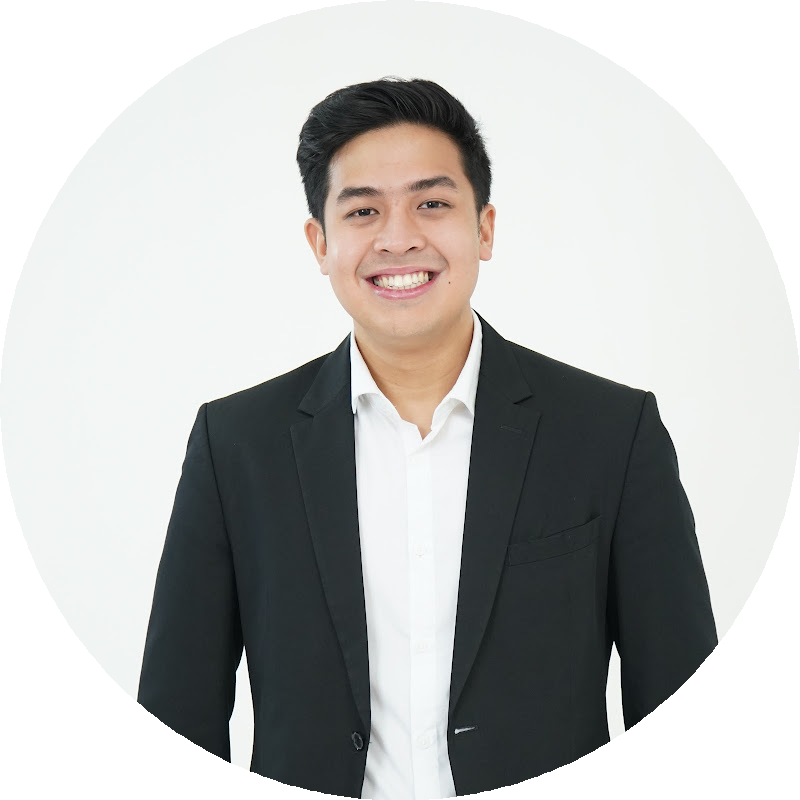
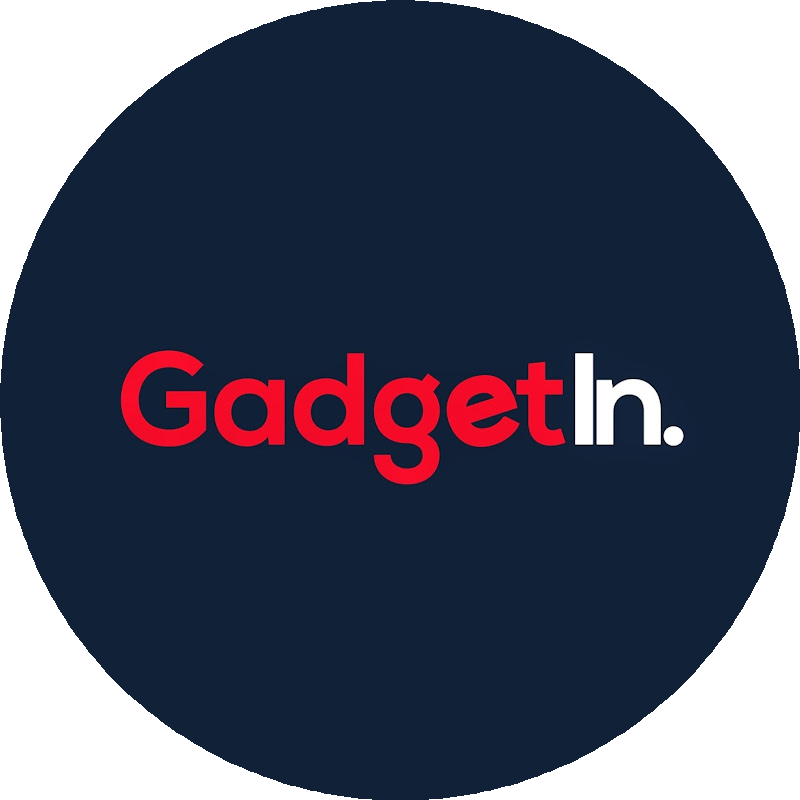
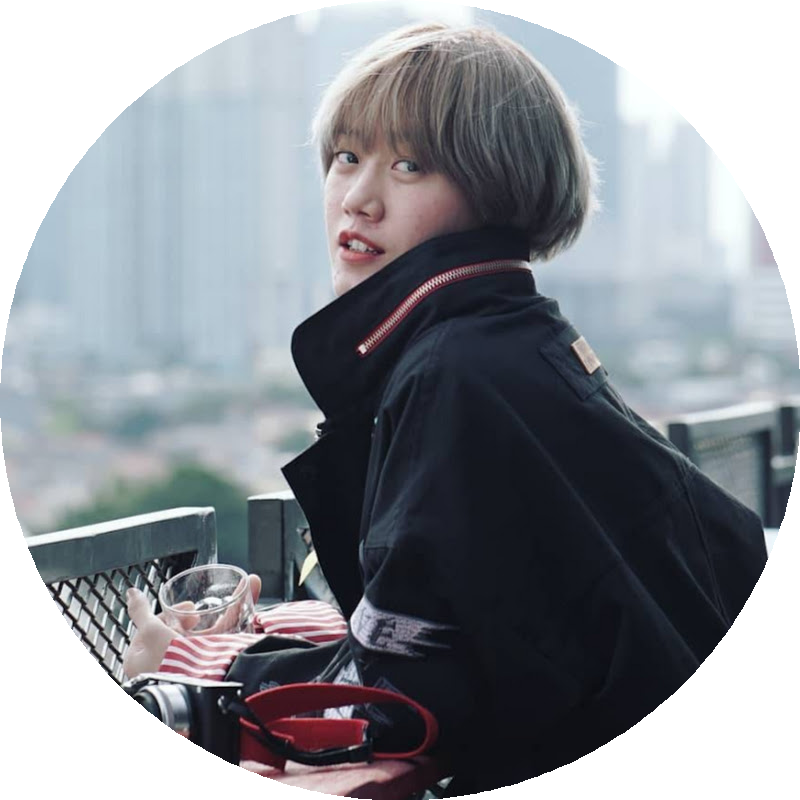
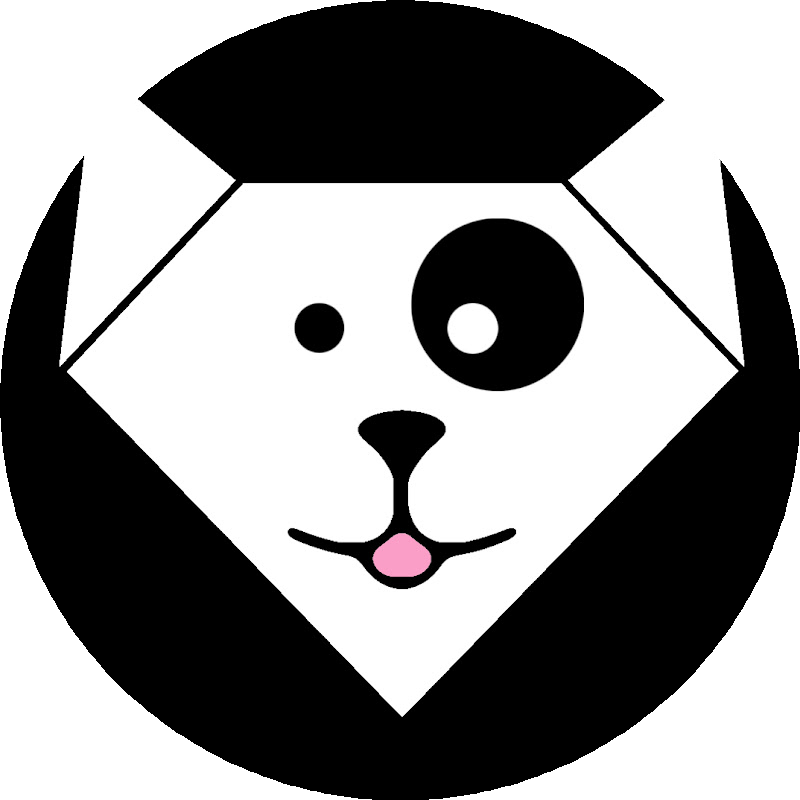
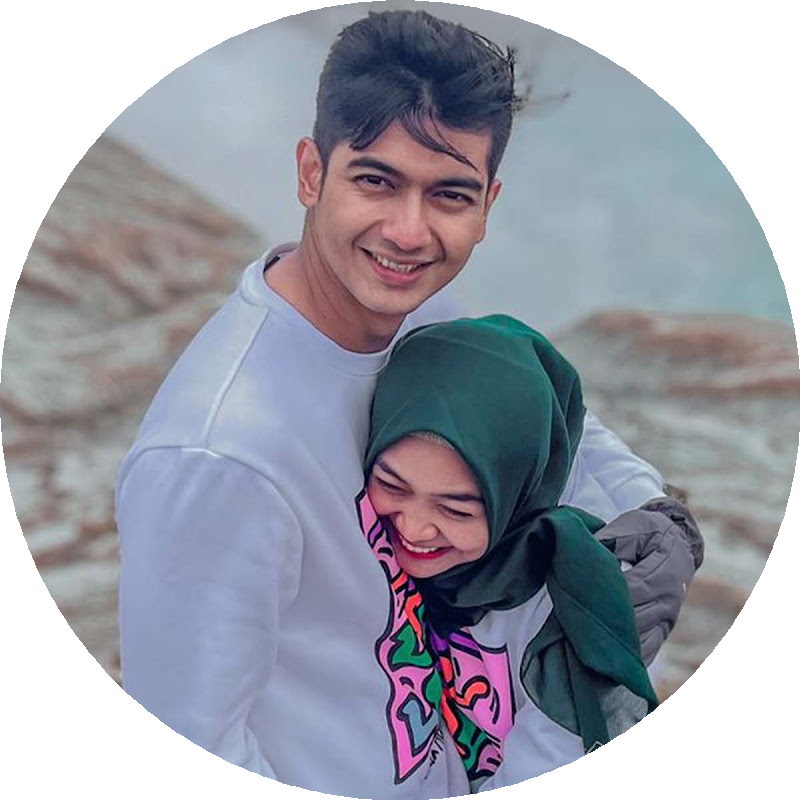
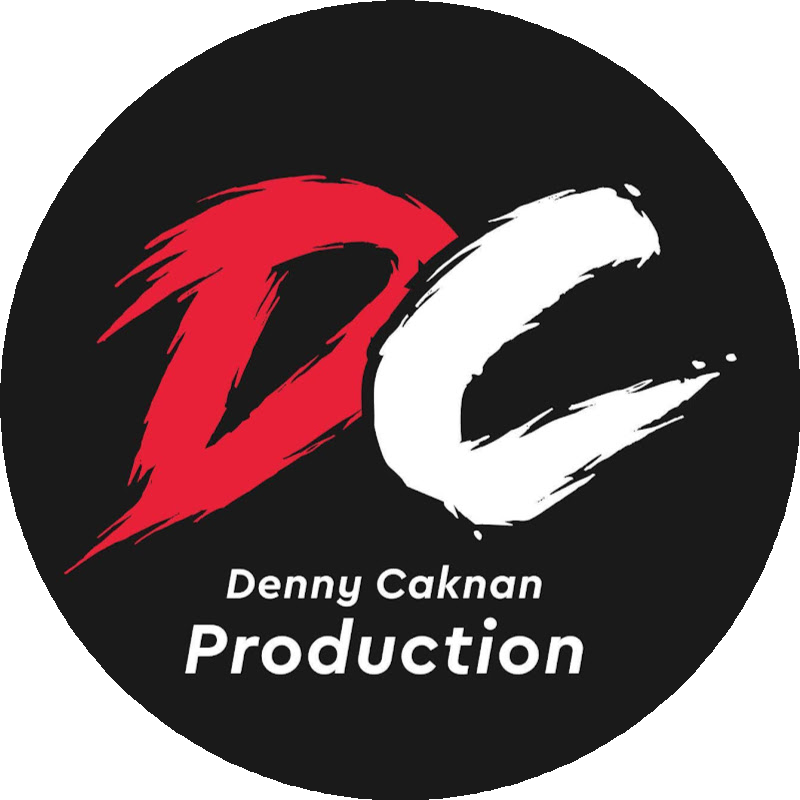
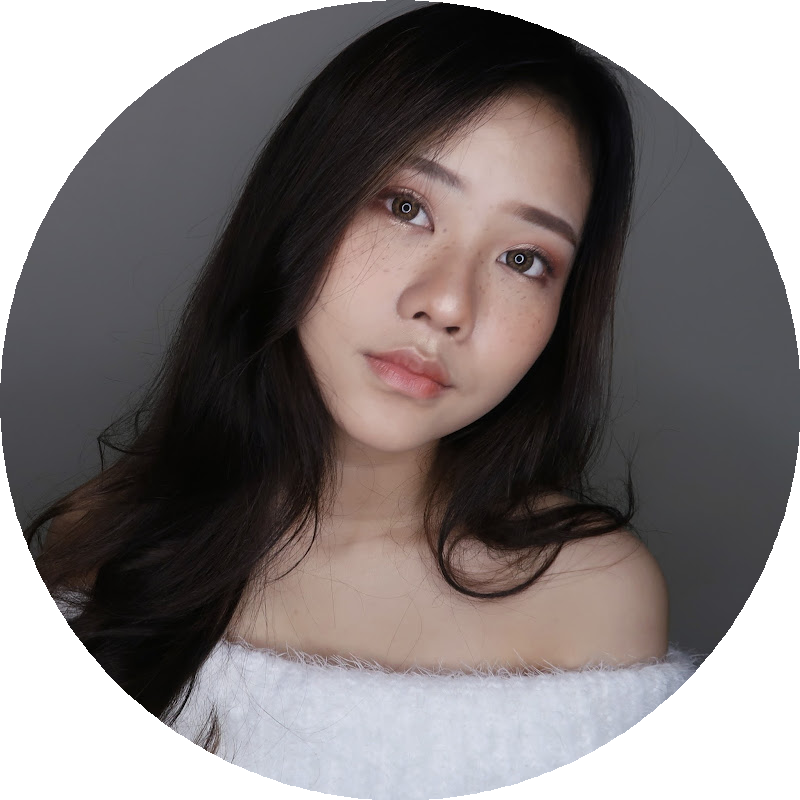
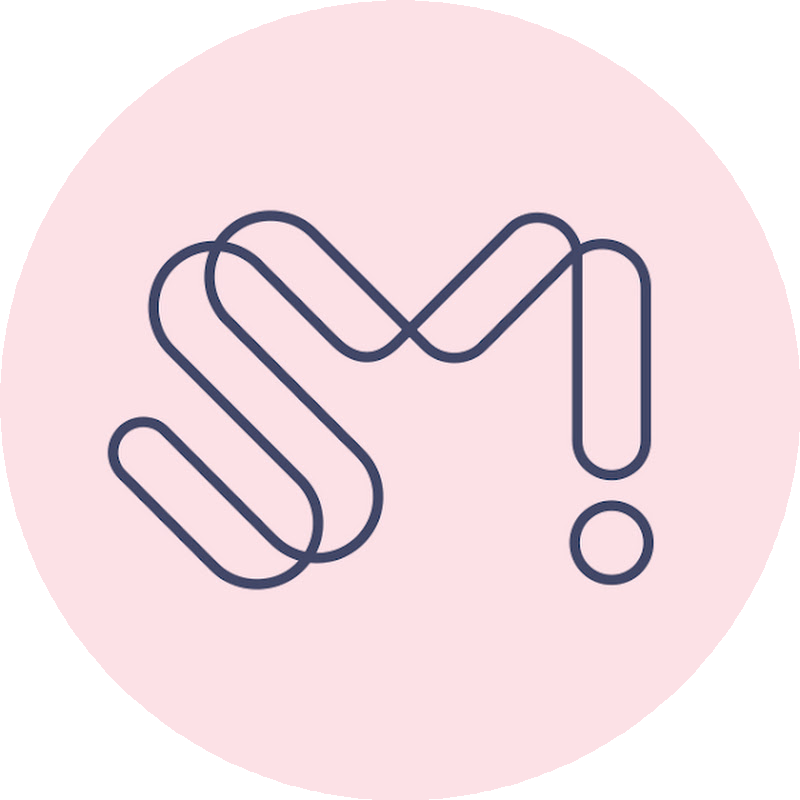
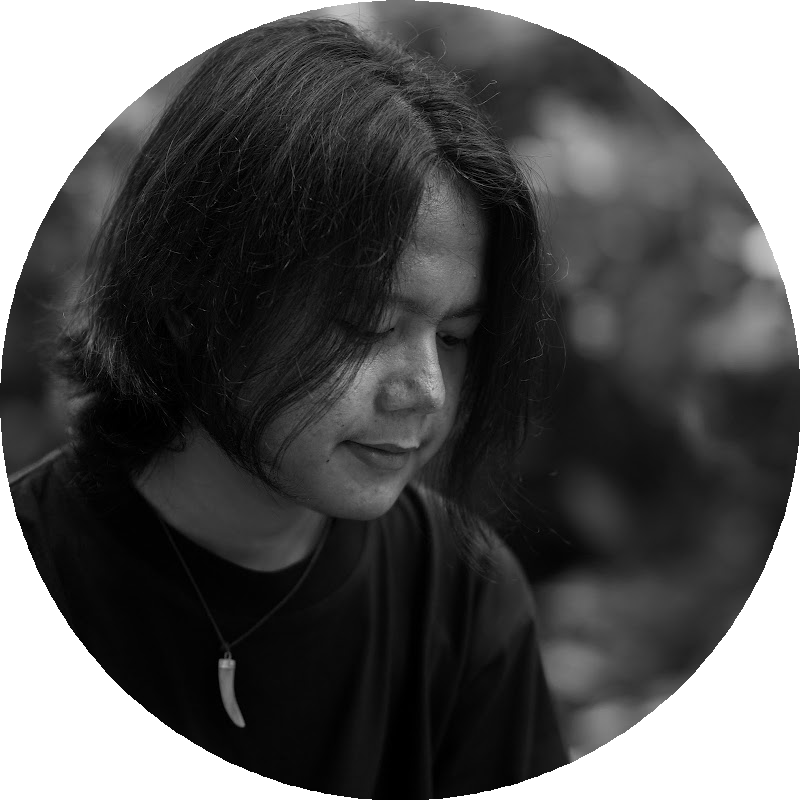
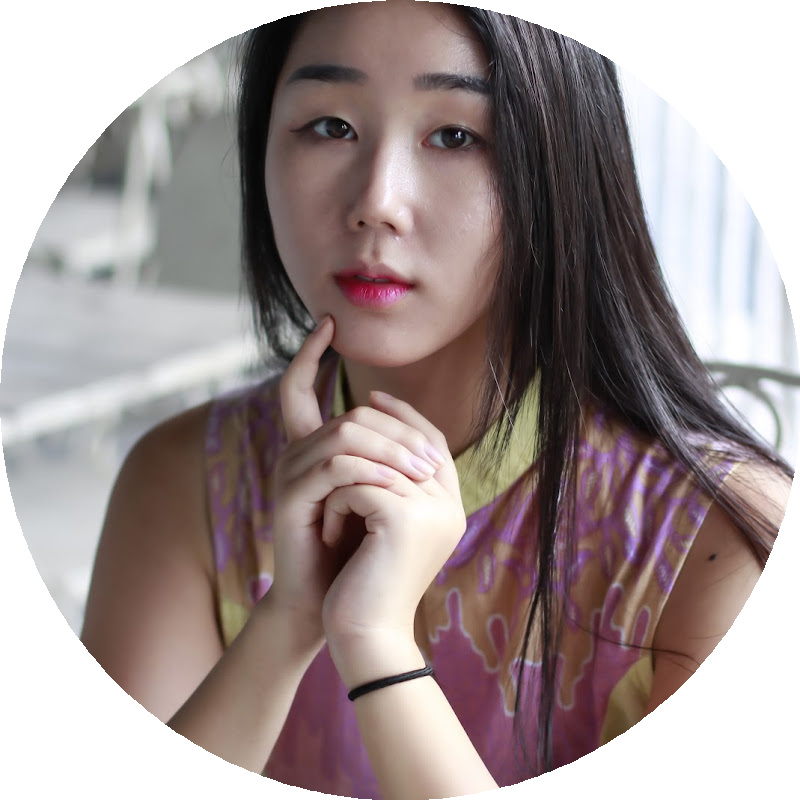

In [ ]:
fig = px.bar(top_channels, y='channelTitle', x="videoId", text_auto=True, color='Category',
             title="Channels with Most Trending Videos Appearances", 
             labels={"videoId":"Trending Videos Appearances", "channelTitle":"Channel Name"},
             )
fig.update_layout(height=500, width=800)
fig.update_traces(marker_line_width=0.1, marker_line_color="black")
fig.update_yaxes(categoryorder='total ascending')
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.045, font_size=14,
                   text="<i>Entertainment and Music channels are the most dominating</i>", showarrow=False)

y = 9
for image in images:
    fig.add_layout_image(
        dict(
            xanchor="left", yanchor="middle",
            xref='x', yref='y',
            source=image,
            x=3, y=y,
            sizey=25, sizex=25
        )
    )
    y -= 1

fig.show()

From the top 10 channels with the most trending videos appearances, ***Entertainment (particularly Vlog) and Music youtube channels are the most dominating***. In my opinion, Nihongo Mantappu videos content can be classified as Entertainment as well. SMTOWN is the only non-Indonesian youtube channel.

#### Trending videos appearances based on video language

In [ ]:
# remove "Unknown" value, and normalize the count to percentage
lang_df = trending_2022.groupby('defaultAudioLanguage').count()['videoId'].to_frame()
lang_df.columns = ['Count']
lang_df = lang_df.drop(index='Unknown')
lang_df = lang_df.sort_values('Count', ascending=False)
lang_df["Percentage"] = lang_df['Count']/sum(lang_df['Count'])
lang_df.head(10)

,Count,Percentage
defaultAudioLanguage,,
id,24888,0.647737
en,7872,0.204877
ko,3790,0.098639
jv,610,0.015876
ja,356,0.009265
zxx,349,0.009083
es,165,0.004294
zh,107,0.002785
ru,85,0.002212


In [ ]:
lang_df.sum()

Count         38423.0
Percentage        1.0
dtype: float64

For visualization, only show the top 3 language (id: Indonesian, en: English and ko: Korean) and categorize the rest as "others".

In [ ]:
top_lang = lang_df.loc[['id', 'en', 'ko'], 'Percentage']
top_lang = top_lang.rename({'id':'Indonesian', 'en':'English', 'ko':'Korean'})

# make waffle chart
xlim = 20
ylim = 6
xpos = 0
ypos = ylim -1
data = []
total = xlim * ylim
waffle_count = round(top_lang * total)
waffle_count['Others'] = total - sum(waffle_count)
waffle_count = waffle_count.astype('int')

for lang, count in waffle_count.iteritems():
    x = []
    y = []
    for m in range(count):
        if xpos == xlim:
            xpos = 0
            ypos -= 1
        x.append(xpos)
        y.append(ypos)        
        xpos += 1
    data.append(go.Scatter(x=x, y=y, mode='markers', name=lang,
                           marker_symbol='square', marker_size= 30,                        
                           ))
fig = go.Figure()
fig.add_traces(data)
fig.update_layout(title='Trending Videos Appearances by Video Language', xaxis_visible=False, 
                  yaxis_visible=False, height=300, width=900, legend_title_text='Language')
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.075, font_size=14,
                   text="<i>Most of the trending videos languages are Indonesian, followed by English and Korean</i>", 
                   showarrow=False)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=-0.06,
                   text="<b>Indonesian:</b> 64.8% (24888)     <b>English:</b> 20.5% (7872)     <b>Korean:</b> 9.9% (3790)     <b>Others:</b> 4.8% (1873)</i>", 
                   showarrow=False)
fig.update_traces(hovertemplate="Language")
fig.show()

***Local (Indonesian) videos are dominating the trending pages, but English and Korean videos occassionally also appear in the trending pages.*** Videos with other languages are rarely appear in the trending page.

#### Top title keywords in trending videos

In [ ]:
! pip install Sastrawi

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

nltk.download('stopwords')
nltk.download('punkt')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 209 kB 4.0 MB/s 


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
# Configure tokenizer (text splitter) and stop words
tokenizer = nltk.RegexpTokenizer(r"\w+")
stop_words_id = StopWordRemoverFactory().get_stop_words()
stop_words_en = stopwords.words('english')
stop_words = set(stop_words_id + stop_words_en)
stop_words.update(['part'])

# Function to remove stopwords
def clean_gram(gram, stop_words):
    for word in gram:
        if word in stop_words:
            return False
    return True

# Function to convert bigram from set into string
def stringify_bigram(bigram):
    str_bigram = str(bigram).replace("(","").replace(")","").replace("'","").replace(",","").title()
    return str_bigram

In [ ]:
# Convert the title into lower letter, then split the title into a list of words
# Make a list of bigrams (combination of two words)
titles = trending_2022['videoTitle'].str.lower()
titles = titles.apply(lambda x: tokenizer.tokenize(x))
titles = titles.apply(lambda x: (list(nltk.bigrams(x))))

# Count the appearances of each bigram and remove bigrams containing stopwords
titles_bigrams_count = titles.explode().value_counts()
titles_bigrams_count = titles_bigrams_count.reset_index()
titles_bigrams_count.columns = ['Bigram', 'Appearances']
filter = titles_bigrams_count['Bigram'].apply(lambda x: clean_gram(x, stop_words))
titles_bigrams_count = titles_bigrams_count[filter]
titles_bigrams_count['Bigram'] = titles_bigrams_count['Bigram'].apply(stringify_bigram)

In [ ]:
# Make a top 20 list and categorize the bigrams
top_20_bigrams = titles_bigrams_count[:20].reset_index(drop=True)
top_20_bigrams['Category'] = ["Music"] * 20
top_20_bigrams.loc[[6, 13, 14, 15, 17, 18],'Category'] = 'Other'
filter = top_20_bigrams['Category'] == 'Music'
top_20_bigrams.loc[filter, 'Music Genre'] = "Non-specific"
top_20_bigrams.loc[[4, 5, 10, 11, 12],'Music Genre'] = 'Dangdut'
top_20_bigrams.loc[[16],'Music Genre'] = 'Kpop'
top_20_bigrams = top_20_bigrams.fillna('NA')

In [ ]:
fig = px.treemap(top_20_bigrams, path=[px.Constant('<b>Title Keywords</b>'),
                'Bigram'], values='Appearances', color='Music Genre',
                 color_discrete_map={'(?)':'#87e1e1', 'Dangdut':'#ffd154', 'NA':'#15cf6b' ,'Kpop':'#d9590f' , 'Non-specific':'#1F77B4' }, title='Top 20 Title Keywords in Trending Videos')
fig.update_traces(textinfo='label+value', hovertemplate='Labels=%{label}<br>Appearances=%{value}<br>Music Genre=%{customdata[0]}<extra></extra>')
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.042, font_size=14,
                   text="<i>Majority of the top title keywords are related to general music term and dangdut (a music genre)</i>", showarrow=False)
fig.update_layout(height=600, width=800, margin_b=50)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=-0.04, font_size=12,
                   text= "🟦: Non-specific (general) music     🟨: Dangdut music     🟥: Korean music     🟩: Other (non-music)", showarrow=False)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=-0.08, font_size=12,
                   text= "The number indicates the count of trending videos appearances", showarrow=False)
fig.update_traces(marker_line_width=2)
fig.show()

***Many of the top title keywords are related to music***, and this is due to 2 reasons: 1) Videos with music categories appear a lot in the trending pages and 2) Music videos often include similar terms in their title. ***There are also some keywords related to Dangdut content which indicate the popularity of Dangdut music in 2022.***

#### Top tags in trending videos

In [ ]:
# Extract the tag from each column and count the occurence of each tag
tags = trending_2022['tags'].str.lower()
tags = tags.str.replace("[", "").str.replace("]", "").str.replace("'", "")
tags = tags.str.split(", ")
tag_count = tags.explode().value_counts()
tag_count = tag_count.drop('not written')
tag_count.index = tag_count.index.str.title()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [ ]:
fig = px.bar(tag_count[:10], title="Top 10 Tags in Trending Videos",  
             labels={"value":"Appearances", "index":"Tags"}, color='value', 
             color_continuous_scale="purp", text_auto=True, width=750)
fig.update_layout(showlegend=False, coloraxis_showscale=False)
fig.add_vrect(x0=2.5, x1=9.5, fillcolor="lightsalmon", opacity=0.4, line_width=0, layer='below')
fig.add_annotation(x=6, y=2600,
                   text="Tags related to music and entertainment", showarrow=False)
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>The top 3 keywords are not very descriptive, but could possibly improve the content visibility</i>", showarrow=False)
fig.data[0].x = [s.replace('Denny Caknan', 'Denny<br>Caknan') for s in fig.data[0].x]
fig.show()

Adding tags can improve the videos placement in search results which hopefully will attract more viewers. Since most (64.8%) of the trending videos are Indonesian, it makes sense that indonesia is the most appearing tag in trending videos. ***The 2nd and 3rd tags (trending and viral) are not very descriptive, but maybe they could improve the content visibility***. ***The rest of the tags are mostly related to entertainment and music***, and they are more specific in describing the content of the videos. Dangdut is a genre of music, and Denny Caknan along with Yeni Inka are Dangdut music content creator. Lucu means funny in English.

 #### Ratio of capital letters in the video title

In [ ]:
# Count the total capital letters and letters in the title and find the ratio
viz_df = trending_2022[['videoTitle']].copy()
viz_df['letters'] = viz_df['videoTitle'].str.findall('[a-zA-Z]')
viz_df['capital_letters'] = viz_df['videoTitle'].str.findall('[A-Z]')
viz_df['letter_count'] = viz_df['letters'].apply(lambda x: len(x))
viz_df['capital_count'] = viz_df['capital_letters'].apply(lambda x: len(x))
capital_ratio = viz_df['capital_count']/viz_df['letter_count']

In [ ]:
fig = px.histogram(capital_ratio, title="Ratio of Capital Letters in the Title",
                   labels={"value":"Ratio of Capital Letters"}, nbins=25,)
fig.update_layout(showlegend=False)
fig.update_traces(hovertemplate="Ratio=%{x}<br>Appearances=%{y:d}<extra></extra>")
fig.add_annotation(xref='x domain', yref="y domain", x=0.5, y=1.06, font_size=14,
                   text="<i>Around 32% of the videos appearing in the trending page have a fully capitalized title</i>", showarrow=False)
fig.update_yaxes(title="Appearances")
fig.add_annotation(x=1, y=14500,
            text="Videos with fully capitalized title",
            showarrow=True,
            arrowhead=2, ax=-120, ay=0)
fig.show()

There are two modes for the ratio of capital letters in the title, one with a ratio of 0.125-0.225 and another with a ratio of 0.95-1. ***It seems a fully capitalized title can help video to gain more tractions.***

## Conclusion

We have analyzed 47k of trending videos appearances in Indonesia since the start of 2022 and get the following insights:
* Videos with SD definition (less than or equal to 480p) have a very low chance to appear in the trending page.
* Caption availability is not an important criteria to become a trending video.
* The most popular categories in 2022 are Entertainment and Music, while the least popular categories are Nonprofits & Activism and Travel & Events. 
* Some less popular categories (e.g. Science & Technology) can have more views on average compared to the more popular categories.
* Although like and view counts are highly correlated, the ratio between like and view counts is varying accross different categories. Similarly the ratio between comment and view counts is also varying accross different categories. 
* Trending Nonprofits & Activism videos generally have a high number of engagements while sport videos generally have a low number of engagement.
* Videos published on Friday appear in the trending page more often compared to videos published on the other days, which is probably due to the fact that videos with ages of 1-2 days old appear the most freuqently in the trending page, and people generally have more free time on Saturday and Sunday.
* Videos published in the evening (16:00-20:00) are more like to trend compared to other time.
* Entertainment, Music and People & Blog videos can have a longer trend compared to other categories. A single video from those categories can reappear in the trending pages for more than 30 times (> 30 days).
* Around 65% of the trending videos in Indonesia are videos with Indonesian language.
* Dangdut (a music genre) related keywords appear quite frequently in the trending pages, which indicates its popularity in 2022.
* Some tags (e.g. trending and viral) are not very descriptive, but could possibly increase videos searchability. 
* A fully capitalized title can possibly help video to gain more tractions.

## References

1. https://www.youtube.com/watch?v=D56_Cx36oGY
2. https://www.kaggle.com/code/hoonkeng/deep-analysis-on-youtube-trending-videos-eda#Analysis:-Sentiment-analysis-on-Video's-tags
3. https://www.kaggle.com/code/kabure/extensive-usa-youtube-eda
4. https://www.kaggle.com/code/donyoe/exploring-youtube-trending-statistics-eda/report